In [1]:
import momepy
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
import shapely

import osmnx as ox

from libpysal.weights import fuzzy_contiguity

/home/virgilxw/miniconda3/lib/python3.10/site-packages/momepy/coins.py:15: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
local_crs = 3414

place = "Singapore"

latlng = (1.29, 103.85)
dist = 30000

study_area = gpd.read_file("./Singapore_studyArea.shp").to_crs(epsg=4326)

# assuming your geodataframe is called `gdf` and the geometry column is called `geometry`
study_area = study_area.geometry.unary_union

In [3]:
# buildings = ox.geometries.geometries_from_place(place, tags={'building':True})
# buildings = ox.geometries.geometries_from_point(latlng, tags={'building':True}, dist=dist)
buildings = ox.geometries.geometries_from_polygon(study_area, tags={'building':True})
buildings.head()

amenity                   geometry addr:street  \
element_type osmid                                                      
node         518475196     NaN  POINT (103.81225 1.30876)         NaN   
             965698989     NaN  POINT (103.82913 1.29577)         NaN   
             965700669     NaN  POINT (103.82906 1.29618)         NaN   
             965700671     NaN  POINT (103.82825 1.29639)         NaN   
             965700673     NaN  POINT (103.83048 1.29633)         NaN   

                       entrance alt_name bench  bin  bus highway location  \
element_type osmid                                                          
node         518475196      NaN      NaN   NaN  NaN  NaN     NaN      NaN   
             965698989      NaN      NaN   NaN  NaN  NaN     NaN      NaN   
             965700669      NaN      NaN   NaN  NaN  NaN     NaN      NaN   
             965700671      NaN      NaN   NaN  NaN  NaN     NaN      NaN   
             965700673      NaN      NaN   NaN  NaN  NaN     NaN      NaN   

                        ... ways building:1992-2017 name:1992-2017 name:vi  \
element_type osmid      ...                                                  
node         518475196  ...  NaN                NaN            NaN     NaN   
             965698989  ...  NaN                NaN            NaN     NaN   
             965700669  ...  NaN                NaN            NaN     NaN   
             965700671  ...  NaN                NaN            NaN     NaN   
             965700673  ...  NaN                NaN            NaN     NaN   

                       garden:type parking:condition:both parking:lane:both  \
element_type osmid                                                            
node         518475196         NaN                    NaN               NaN   
             965698989         NaN                    NaN               NaN   
             965700669         NaN                    NaN               NaN   
             965700671         NaN                    NaN               NaN   
             965700673         NaN                    NaN               NaN   

                       end_date payment:activesg_app_credits roof:level  
element_type osmid                                                       
node         518475196      NaN                          NaN        NaN  
             965698989      NaN                          NaN        NaN  
             965700669      NaN                          NaN        NaN  
             965700671      NaN                          NaN        NaN  
             965700673      NaN                          NaN        NaN  

[5 rows x 423 columns]

In [4]:
buildings.head()

buildings = buildings[buildings.geom_type == "Polygon"].reset_index(drop=True)
buildings = buildings[["geometry"]].to_crs(local_crs)
print(buildings.geom_type.value_counts())


Polygon    112491
dtype: int64


Above loads building into a geojson file

In [5]:
buildings.head()

,geometry
0,"POLYGON ((18617.869 36738.578, 18629.743 36729..."
1,"POLYGON ((13728.615 35618.333, 13736.938 35595..."
2,"POLYGON ((34094.370 39221.964, 34088.449 39229..."
3,"POLYGON ((45916.033 38548.540, 45911.592 38554..."
4,"POLYGON ((30198.721 31654.180, 30193.001 31658..."


In [6]:
buildings["uID"] = range(len(buildings))
buildings.head()

,geometry,uID
0,"POLYGON ((18617.869 36738.578, 18629.743 36729...",0
1,"POLYGON ((13728.615 35618.333, 13736.938 35595...",1
2,"POLYGON ((34094.370 39221.964, 34088.449 39229...",2
3,"POLYGON ((45916.033 38548.540, 45911.592 38554...",3
4,"POLYGON ((30198.721 31654.180, 30193.001 31658...",4


In [7]:
# osm_graph = ox.graph_from_point(latlng, dist=dist, network_type='drive')

osm_graph= ox.graph.graph_from_polygon(study_area, network_type='drive')
osm_graph = ox.projection.project_graph(osm_graph, to_crs=local_crs)
streets = ox.graph_to_gdfs(
    osm_graph,
    nodes=False,
    edges=True,
    node_geometry=False,
    fill_edge_geometry=True
)
streets.head()

osmid  \
u          v          key                                                      
25451915   25451918   0    [166741187, 649636776, 649636777, 717446235, 2...   
25451918   242636478  0                                             22617511   
           1143899970 0                                            166741192   
242636478  4656921454 0                      [37584993, 37584994, 655660141]   
1143899970 1782376557 0                                            200159288   

                           oneway      lanes  ref                    name  \
u          v          key                                                   
25451915   25451918   0      True     [4, 3]  ECP      East Coast Parkway   
25451918   242636478  0      True          1  NaN                     NaN   
           1143899970 0      True          3  ECP      East Coast Parkway   
242636478  4656921454 0      True  [4, 3, 2]  NaN  Tanah Merah Coast Road   
1143899970 1782376557 0      True          3  ECP      East Coast Parkway   

                                 highway maxspeed reversed   length bridge  \
u          v          key                                                    
25451915   25451918   0         motorway       90    False  963.113    yes   
25451918   242636478  0    motorway_link       50    False  278.409    NaN   
           1143899970 0         motorway       90    False  670.252    NaN   
242636478  4656921454 0          primary       60    False  301.106    yes   
1143899970 1782376557 0         motorway       90    False  314.233    NaN   

                                                                    geometry  \
u          v          key                                                      
25451915   25451918   0    LINESTRING (44186.853 35217.240, 44144.233 351...   
25451918   242636478  0    LINESTRING (43649.291 34422.228, 43648.779 344...   
           1143899970 0    LINESTRING (43649.291 34422.228, 43492.918 342...   
242636478  4656921454 0    LINESTRING (43724.424 34208.291, 43746.393 342...   
1143899970 1782376557 0    LINESTRING (43269.766 33872.637, 43113.671 336...   

                          access tunnel junction width  
u          v          key                               
25451915   25451918   0      NaN    NaN      NaN   NaN  
25451918   242636478  0      NaN    NaN      NaN   NaN  
           1143899970 0      NaN    NaN      NaN   NaN  
242636478  4656921454 0      yes    NaN      NaN   NaN  
1143899970 1782376557 0      NaN    NaN      NaN   NaN

In [8]:
streets = momepy.remove_false_nodes(streets)
streets = streets[["geometry"]]
streets["nID"] = range(len(streets))

/home/virgilxw/miniconda3/lib/python3.10/site-packages/geopandas/array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as SVY21 / Singapore TM (the single non-null crs provided).
  warnings.warn(


In [9]:
water_bodies_boundaries = []

# Get the water bodies as geometries
water_bodies = ox.geometries_from_polygon(study_area, tags={'natural': 'water'}).set_crs("epsg: 4326").to_crs(local_crs)

# Explode the GeoDataFrame into a GeoSeries of polygons and multipolygons
gs = water_bodies.explode()

# Convert each polygon into a MultiLineString
mls = gs.geometry.boundary

# Convert the MultiLineString into a DataFrame
water_bodies = gpd.GeoDataFrame({'geometry': mls})

for water_body in water_bodies.geometry:
    # Create a LineString object from the coordinates
    water_bodies_boundaries.append(water_body)

coastlines = ox.geometries_from_polygon(study_area, tags={'natural': 'coastline'}).set_crs("epsg: 4326").to_crs(local_crs)

coastlines = coastlines[coastlines.geom_type == "LineString"].reset_index(drop=True)

for coastline in coastlines.geometry:
    # Create a LineString object from the coordinates
    water_bodies_boundaries.append(coastline)

# # Create a GeoDataFrame of the water area boundaries
water_bodies_boundaries = gpd.GeoDataFrame(geometry=water_bodies_boundaries)
water_bodies_boundaries = water_bodies_boundaries[["geometry"]]
water_bodies_boundaries.head()

/tmp/ipykernel_3614/2561600584.py:7: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  gs = water_bodies.explode()


,geometry
0,"LINESTRING (37698.921 36379.463, 37801.240 364..."
1,"LINESTRING (10638.104 45329.526, 10576.655 452..."
2,"LINESTRING (16251.515 32735.477, 16202.884 325..."
3,"LINESTRING (20392.301 40523.349, 20411.654 405..."
4,"LINESTRING (19219.340 37721.260, 19188.801 376..."


In [10]:
enclosures = momepy.enclosures(streets, limit=gpd.GeoSeries([study_area]), additional_barriers=[water_bodies_boundaries])

/home/virgilxw/miniconda3/lib/python3.10/site-packages/geopandas/array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as SVY21 / Singapore TM (the single non-null crs provided).
  warnings.warn(
/home/virgilxw/miniconda3/lib/python3.10/site-packages/geopandas/array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as SVY21 / Singapore TM (the single non-null crs provided).
  warnings.warn(


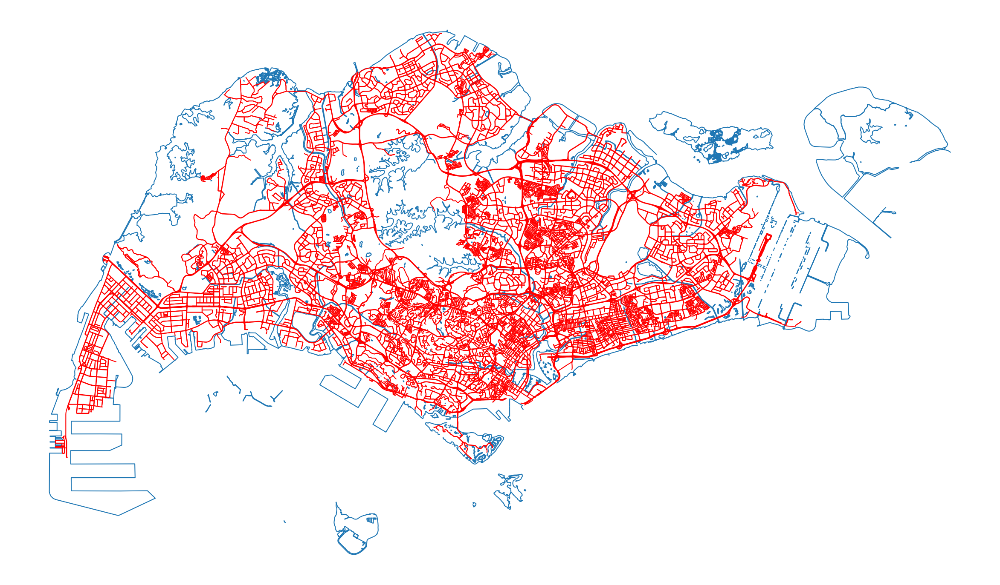

In [11]:
f, ax = plt.subplots(figsize=(30, 30))

water_bodies_boundaries.plot(ax=ax)
streets.plot(ax=ax, color='r')

ax.set_axis_off()
plt.show()

In [12]:
# limit = momepy.buffered_limit(buildings, 100)

tessellation = momepy.Tessellation(buildings, unique_id='uID', verbose=True, segment=1, use_dask=True, enclosures=enclosures).tessellation

# for debugging
tessellation_copy = tessellation

/home/virgilxw/miniconda3/lib/python3.10/site-packages/momepy/coins.py:15: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd
/home/virgilxw/miniconda3/lib/python3.10/site-packages/momepy/coins.py:15: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. 

In [13]:
tessellation = tessellation_copy

# Replace missing uID values with default value
tessellation['uID'] = tessellation['uID'].fillna('x')

# Assign unique uID values to rows without a uID value
mask = tessellation['uID'].astype(str).str.startswith('x')
tessellation.loc[mask, 'uID'] = (mask.cumsum() + 5000000)

tessellation = tessellation.dissolve(by='uID', aggfunc='first', as_index=False)


In [14]:
f, ax = plt.subplots(figsize=(100, 100))
tessellation.plot(ax=ax, edgecolor='black')
buildings.plot(ax=ax, color='white', alpha=.5)
plt.show()

In [15]:
# Check for duplicates based on UID
duplicates = buildings[buildings.duplicated(subset='uID', keep=False)]

# buildings.to_file( "./out/" + 'buildings.shp', driver='ESRI Shapefile')

# Print the duplicate rows
if len(duplicates) > 0:
    print("Buildings: Duplicate UID entries:")
    print(duplicates.head())
    
else:
    print("Buildings: No duplicate UID entries found.")

# Check for duplicates based on UID
duplicates = tessellation[tessellation.duplicated(subset='uID', keep=False)]

# duplicates.to_file( "./out/" + place + 'errors.shp', driver='ESRI Shapefile')

# Print the duplicate rows
if len(duplicates) > 0:
    print("Tesselation: Duplicate UID entries:")
    print(duplicates.head())
else:
    print("Tesselation: No duplicate UID entries found.")

Buildings: No duplicate UID entries found.
Tesselation: No duplicate UID entries found.


In [16]:
# buildings = buildings.sjoin_nearest(streets, max_distance=1000, how="left")
# buildings.head()

In [17]:
# buildings = buildings.drop_duplicates("uID").drop(columns="index_right")
# tessellation = tessellation.merge(buildings[['uID', 'nID']], on='uID', how='left')


In [18]:
print(tessellation)

              uID                                           geometry    eID
0             0.0  POLYGON ((18593.965 36751.429, 18594.904 36752...   6333
1             1.0  POLYGON ((13710.851 35586.842, 13710.502 35587...  13923
2             2.0  POLYGON ((34061.633 39179.554, 34061.446 39179...   1656
3             3.0  MULTIPOLYGON (((45416.725 37882.147, 45426.440...   4523
4             4.0  POLYGON ((30201.124 31627.646, 30199.179 31628...     73
...           ...                                                ...    ...
116389  5011405.0  POLYGON ((39471.269 39259.711, 39463.511 39258...  14936
116390  5011406.0  POLYGON ((39457.029 39257.757, 39463.511 39258...  14937
116391  5011407.0  POLYGON ((39445.872 39283.258, 39442.198 39282...  14938
116392  5011408.0  POLYGON ((40116.266 38064.259, 40116.921 38064...  14939
116393  5011409.0  POLYGON ((40116.921 38064.232, 40116.266 38064...  14940

[116394 rows x 3 columns]


In [19]:
tessellation.to_parquet("./out/singapore/tessellation.pq")
buildings.to_parquet("./out/singapore/buildings.pq")